###Setup

In [1]:
!pip install tensorflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
 import tensorflow as tf

In [3]:
cd /content

/content


In [4]:
 print(tf.__version__)

2.12.0


In [5]:
!git clone https://github.com/tensorflow/models.git

Cloning into 'models'...
remote: Enumerating objects: 85937, done.
remote: Counting objects: 100% (1536/1536), done.
remote: Compressing objects: 100% (659/659), done.
remote: Total 85937 (delta 950), reused 1407 (delta 859), pack-reused 84401
Receiving objects: 100% (85937/85937), 598.79 MiB | 25.08 MiB/s, done.
Resolving deltas: 100% (61452/61452), done.


In [6]:
cd /content/models/research


/content/models/research


In [7]:
pwd

'/content/models/research'

In [8]:
 !protoc object_detection/protos/*.proto --python_out=.


In [9]:
!git clone https://github.com/cocodataset/cocoapi.git


Cloning into 'cocoapi'...
remote: Enumerating objects: 975, done.
remote: Total 975 (delta 0), reused 0 (delta 0), pack-reused 975
Receiving objects: 100% (975/975), 11.72 MiB | 33.63 MiB/s, done.
Resolving deltas: 100% (576/576), done.


In [10]:
cd cocoapi/PythonAPI


/content/models/research/cocoapi/PythonAPI


In [11]:
pwd

'/content/models/research/cocoapi/PythonAPI'

In [12]:
!make

python setup.py build_ext --inplace
running build_ext
cythoning pycocotools/_mask.pyx to pycocotools/_mask.c
/usr/local/lib/python3.10/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/models/research/cocoapi/PythonAPI/pycocotools/_mask.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
building 'pycocotools._mask' extension
creating build
creating build/common
creating build/temp.linux-x86_64-cpython-310
creating build/temp.linux-x86_64-cpython-310/pycocotools
x86_64-linux-gnu-gcc -pthread -Wno-unused-result -Wsign-compare -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -g -fwrapv -O2 -fPIC -I/usr/local/lib/python3.10/dist-packages/numpy/core/include -I../common -I/usr/include/python3.10 -c ../common/maskApi.c -o build/temp.linux-x86_64-cpython-310/../common/maskApi.o -Wno-cpp -Wno-unused-function -std=c99
../comm

In [13]:
cp -r pycocotools /content/models/research


In [14]:
cd /content/models/research

/content/models/research


In [15]:
cp object_detection/packages/tf2/setup.py .

In [16]:
!python -m pip install .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/models/research
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.3/14.3 MB 56.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 68.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.0/28.0 MB 46.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 14.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.1/175.1 kB 24.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 97.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 7.3 MB/s eta 0:00:00
  Pre

In [17]:
!python object_detection/builders/model_builder_tf2_test.py


2023-06-09 22:05:48.004132: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
Running tests under Python 3.10.12: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2023-06-09 22:05:55.098406: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0609 22:05:55.229046 1399

###TRAINING AND EXPORTING

made changes to pipeline to config through https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/training.html#create-tensorflow-records
for trying different models:https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md

In [ ]:
pwd

'/content/models/research'

In [18]:
cd /content/drive/MyDrive/A-TASK-1/Training

/content/drive/MyDrive/A-TASK-1/Training


In [ ]:
!python model_main_tf2.py --model_dir=/content/drive/MyDrive/A-TASK-1/Training/models/my_ssd_resnet50_v1_640x640 --pipeline_config_path=/content/drive/MyDrive/A-TASK-1/Training/models/my_ssd_resnet50_v1_640x640/pipeline.config

In [19]:
cd /content/drive/MyDrive/A-TASK-1/Training

/content/drive/MyDrive/A-TASK-1/Training


In [ ]:
!python exporter_main_v2.py --input_type image_tensor --pipeline_config_path /content/drive/MyDrive/A-TASK-1/Training/models/my_ssd_resnet50_v1_640x640/pipeline.config --trained_checkpoint_dir /content/drive/MyDrive/A-TASK-1/Training/models/my_ssd_resnet50_v1_640x640 --output_directory /content/drive/MyDrive/A-TASK-1/Training/exported_models/my_model


2023-06-02 11:35:21.258875: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
2023-06-02 11:35:25.237383: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, b

###Inference

In [29]:
##Loading the model
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'    # Suppress TensorFlow logging (1)
import pathlib
import tensorflow as tf
import cv2
import argparse
from google.colab.patches import cv2_imshow

# Enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

# PROVIDE PATH TO IMAGE DIRECTORY
IMAGE_PATHS = '/content/drive/MyDrive/A-TASK-1/normalised_images'


# PROVIDE PATH TO MODEL DIRECTORY
PATH_TO_MODEL_DIR = '/content/drive/MyDrive/A-TASK-1/Training/exported_models/my_model'

# PROVIDE PATH TO LABEL MAP
PATH_TO_LABELS = '/content/drive/MyDrive/A-TASK-1/Training/annotation/label_map.pbtxt'

# PROVIDE THE MINIMUM CONFIDENCE THRESHOLD
MIN_CONF_THRESH = float(0.60)

# LOAD THE MODEL

import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

print('Loading model...', end='')
start_time = time.time()

# LOAD SAVED MODEL AND BUILD DETECTION FUNCTION
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

# LOAD LABEL MAP DATA FOR PLOTTING

category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

import numpy as np
from PIL import Image
import os
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.
    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.
    Args:
      path: the file path to the image
    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))


Loading model...Done! Took 12.835631847381592 seconds


In [34]:
from PIL import Image
import os
from datetime import datetime

Running inference for /content/drive/MyDrive/A-TASK-1/normalised_images... Done


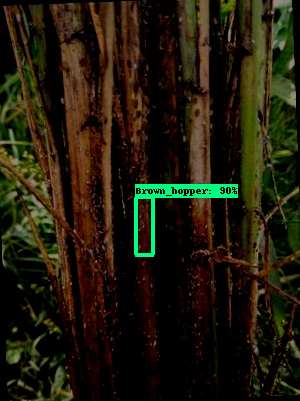

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/Image_36_0609_224149.jpg
Done


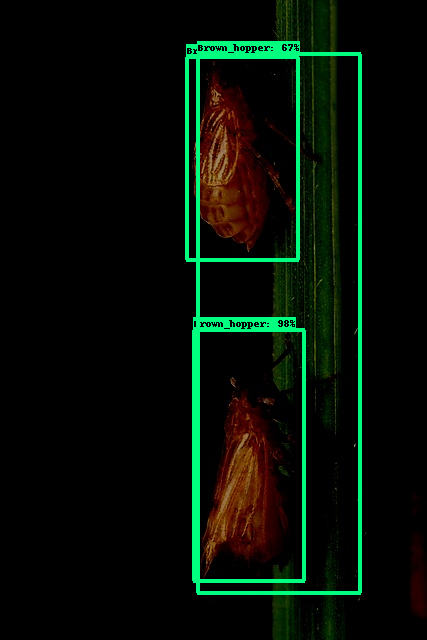

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/Image_25_0609_224150.jpg
Done


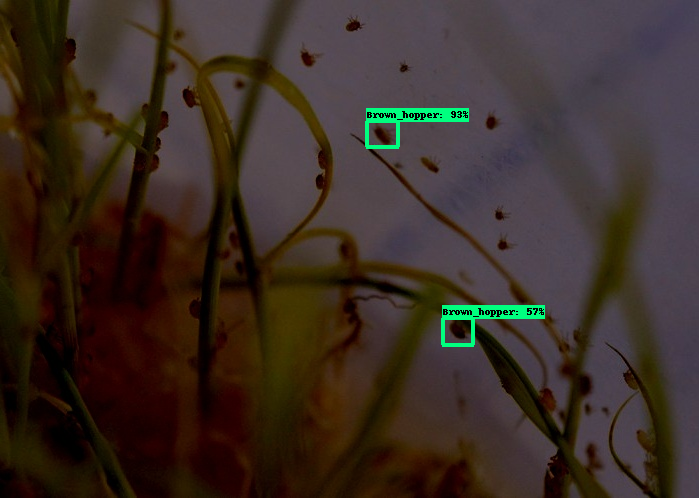

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/Image_33_0609_224150.jpg
Done


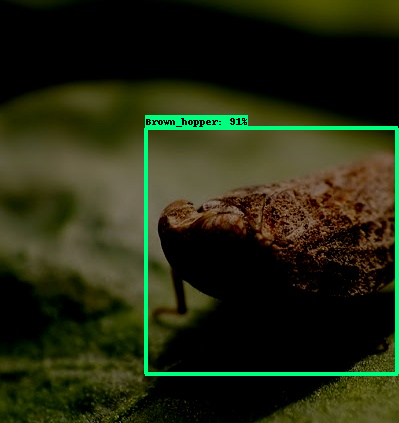

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/Image_40_0609_224150.jpg
Done


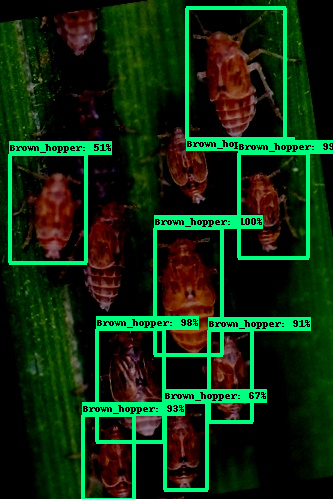

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/Image_43_0609_224150.jpg
Done


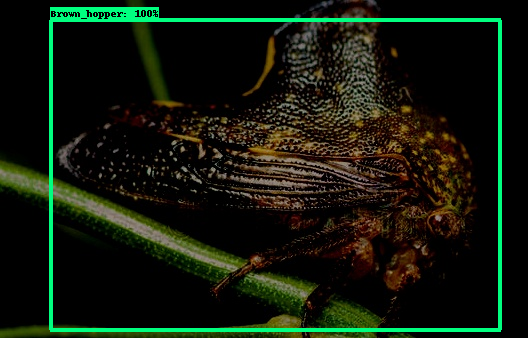

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_47_0609_224150.jpg
Done


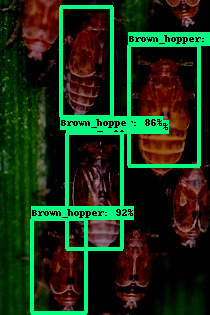

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_43_0609_224151.jpg
Done


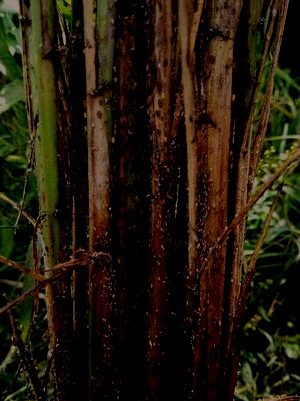

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_36_0609_224151.jpg
Done


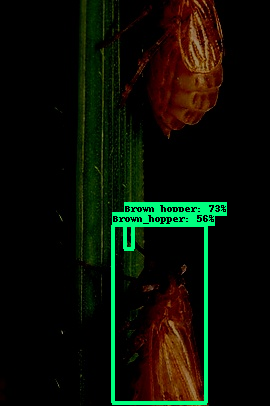

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_25_0609_224151.jpg
Done


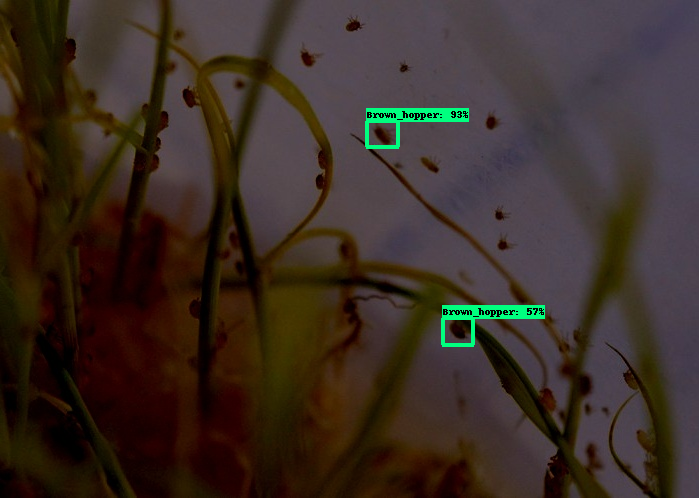

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_33_0609_224151.jpg
Done


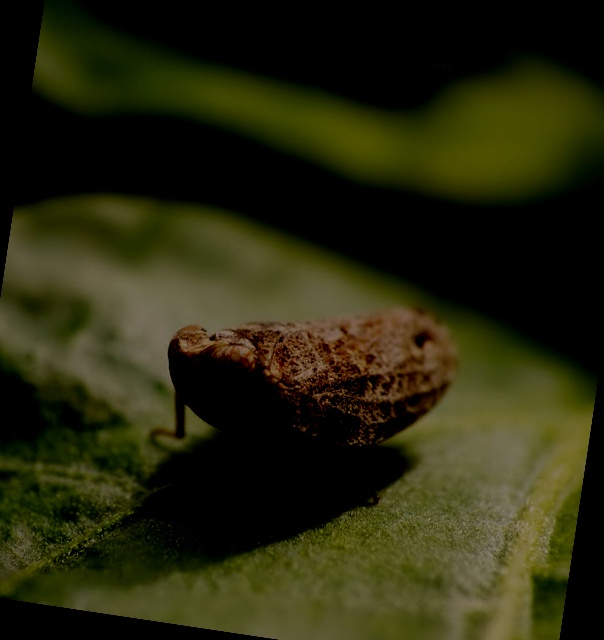

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_40_0609_224151.jpg
Done


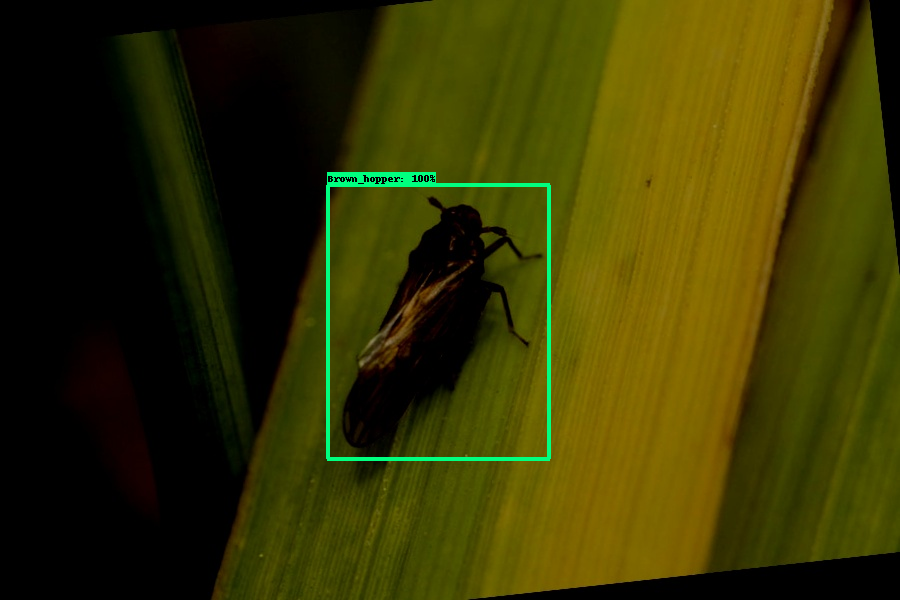

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_22_0609_224151.jpg
Done


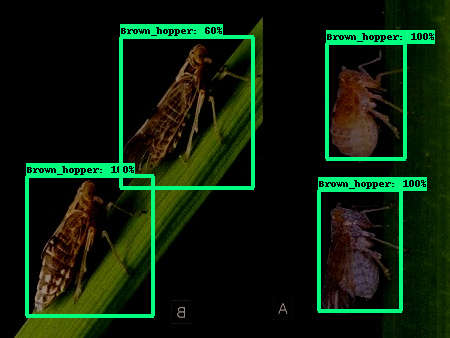

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_11_0609_224152.jpg
Done


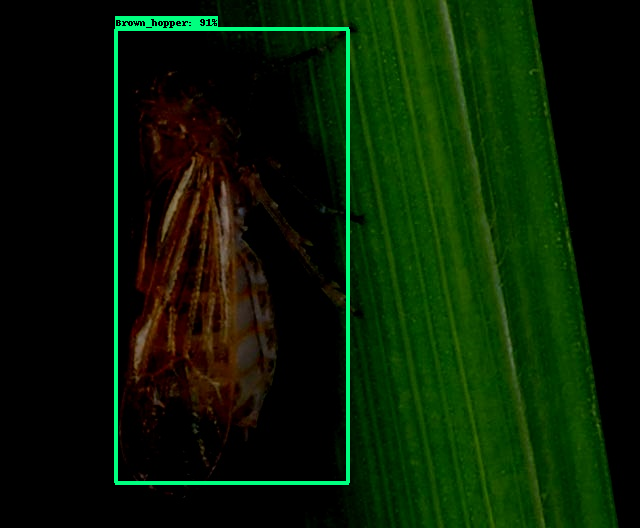

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_2_0609_224152.jpg
Done


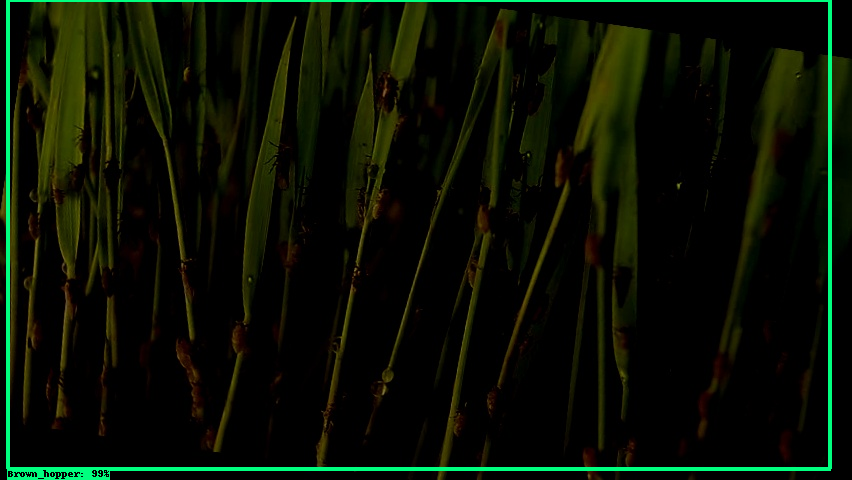

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_44_0609_224152.jpg
Done


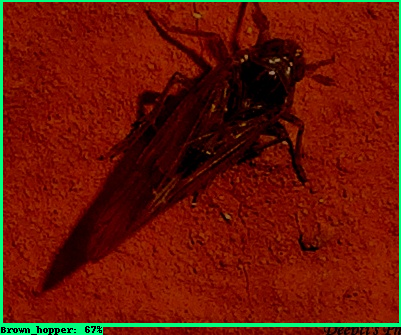

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_24_0609_224152.jpg
Done


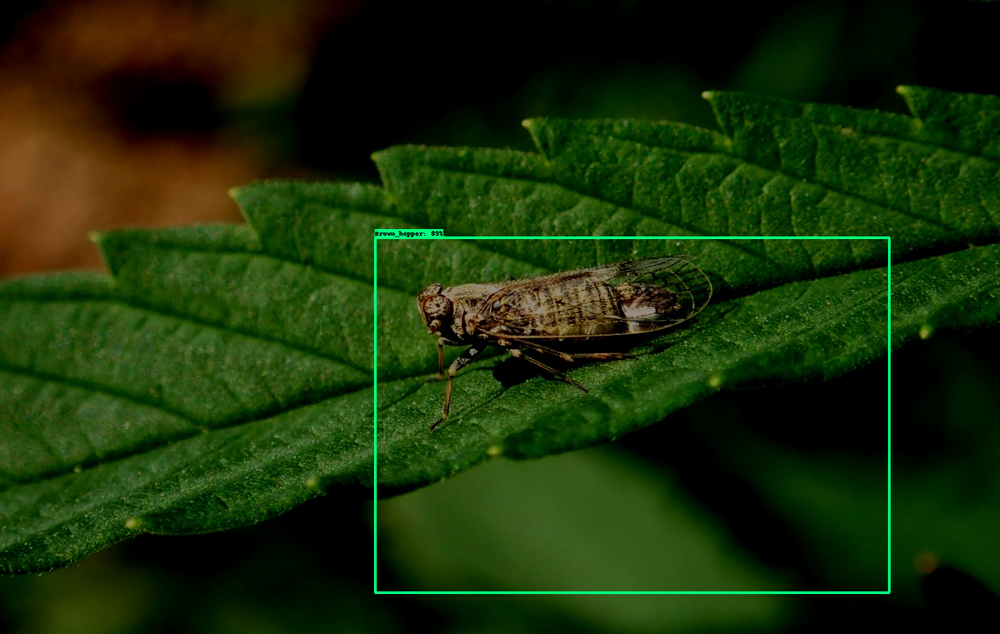

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_42_0609_224153.jpg
Done


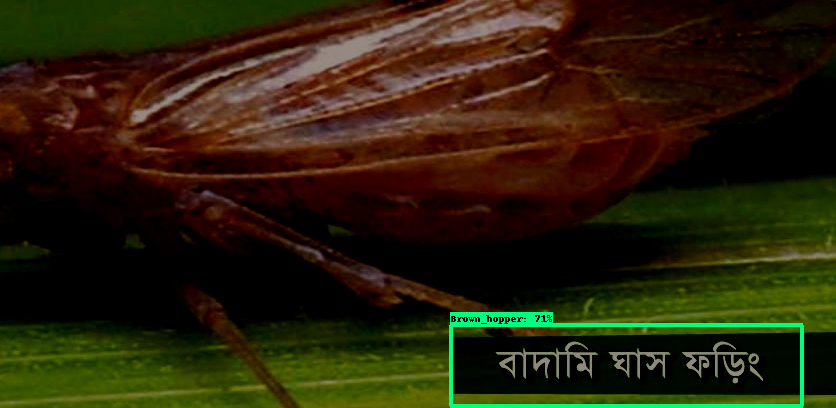

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_13_0609_224153.jpg
Done


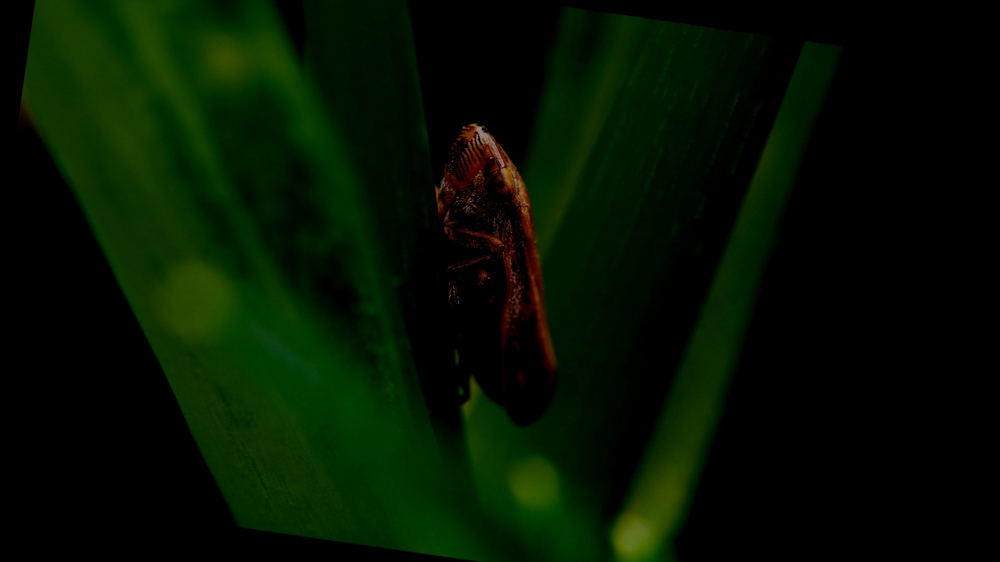

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_37_0609_224154.jpg
Done


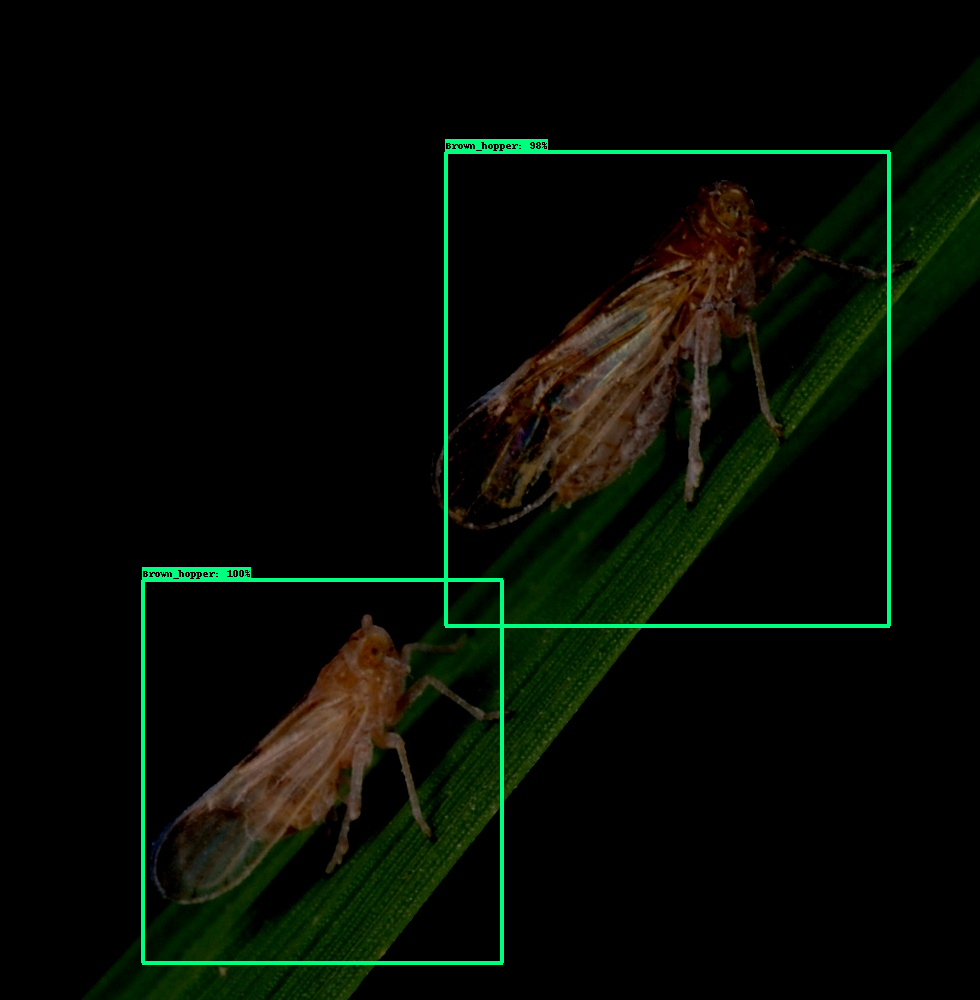

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_4_0609_224154.jpg
Done


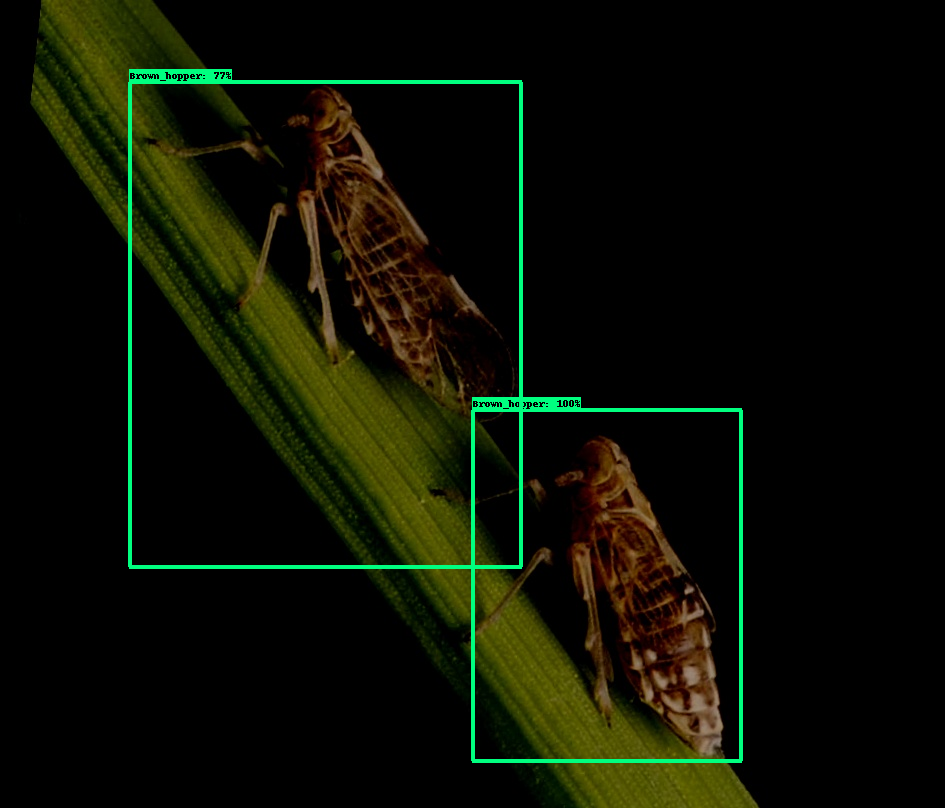

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_1_0609_224155.jpg
Done


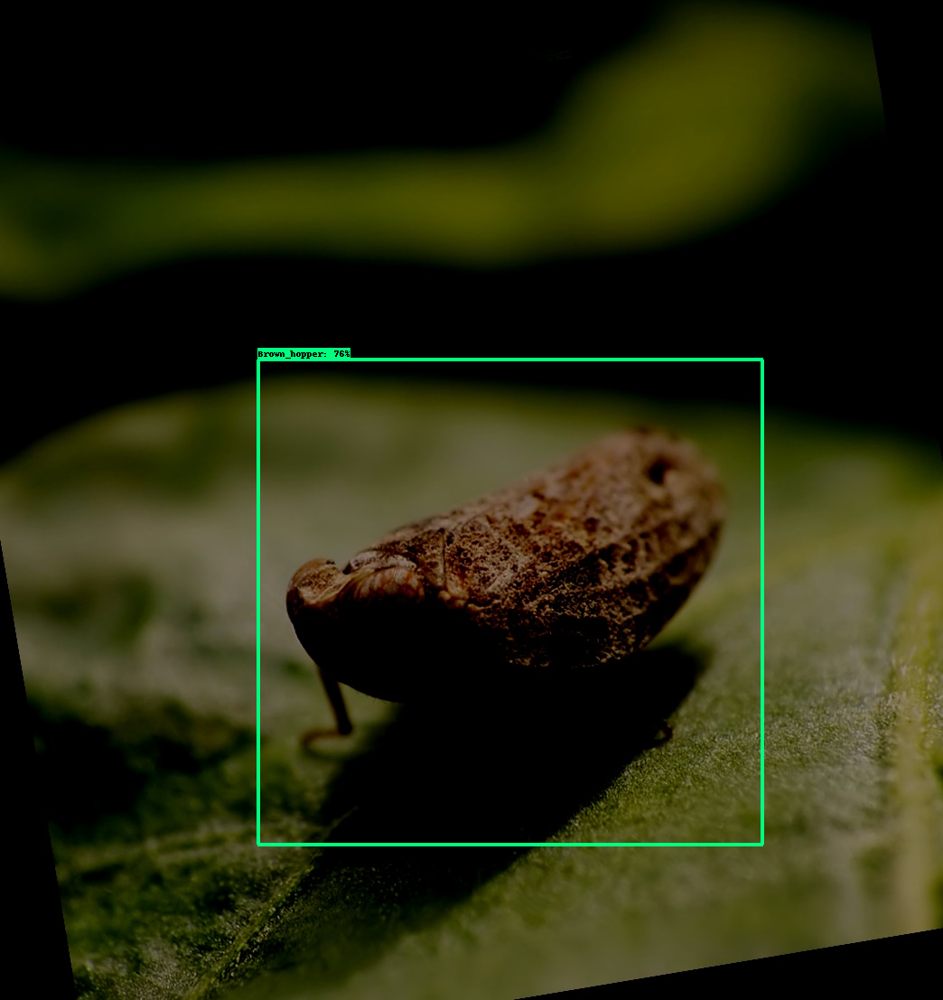

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_3_0609_224155.jpg
Done


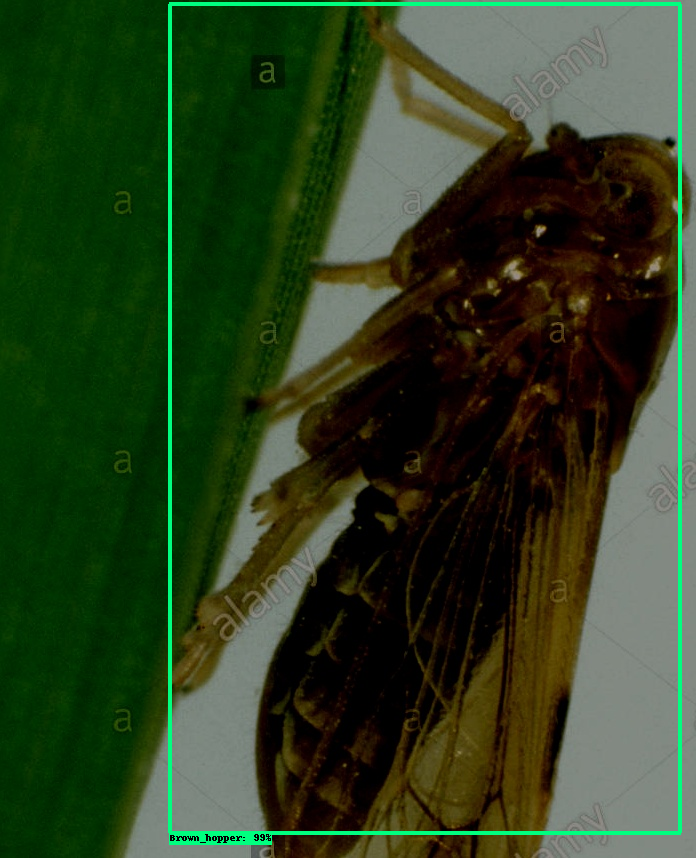

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_46_0609_224155.jpg
Done


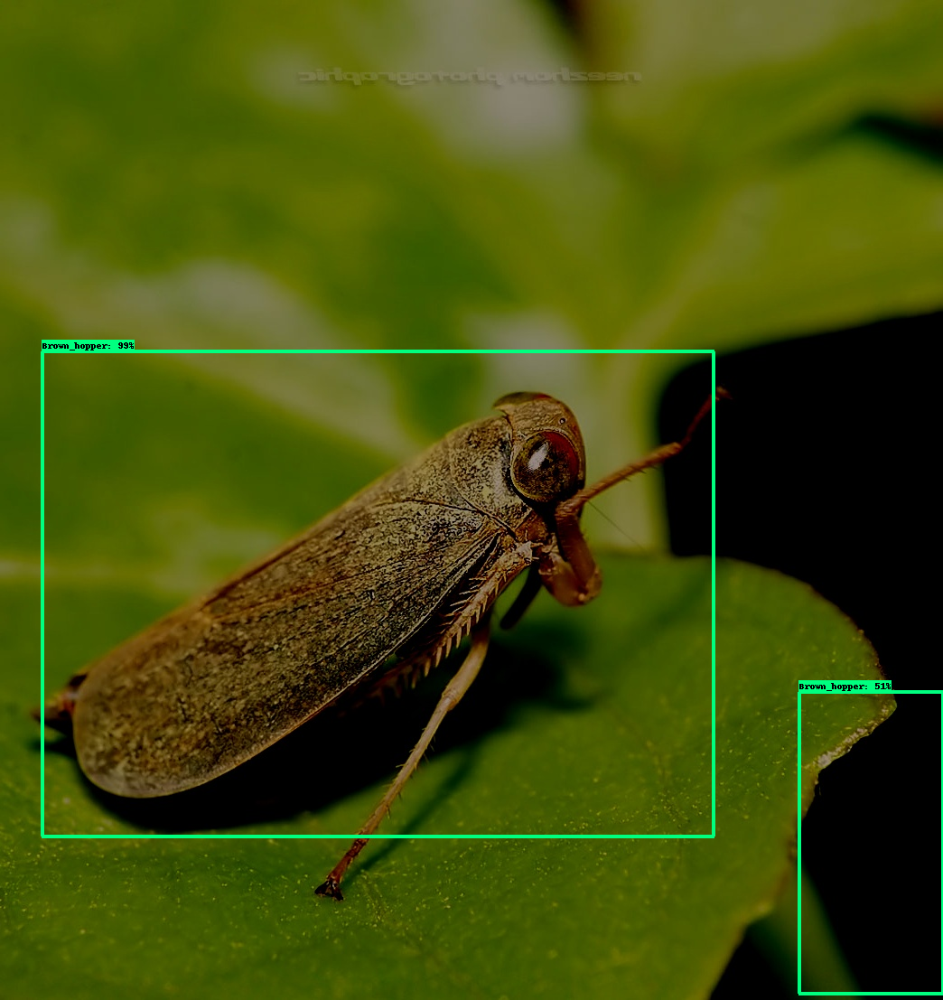

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_29_0609_224156.jpg
Done


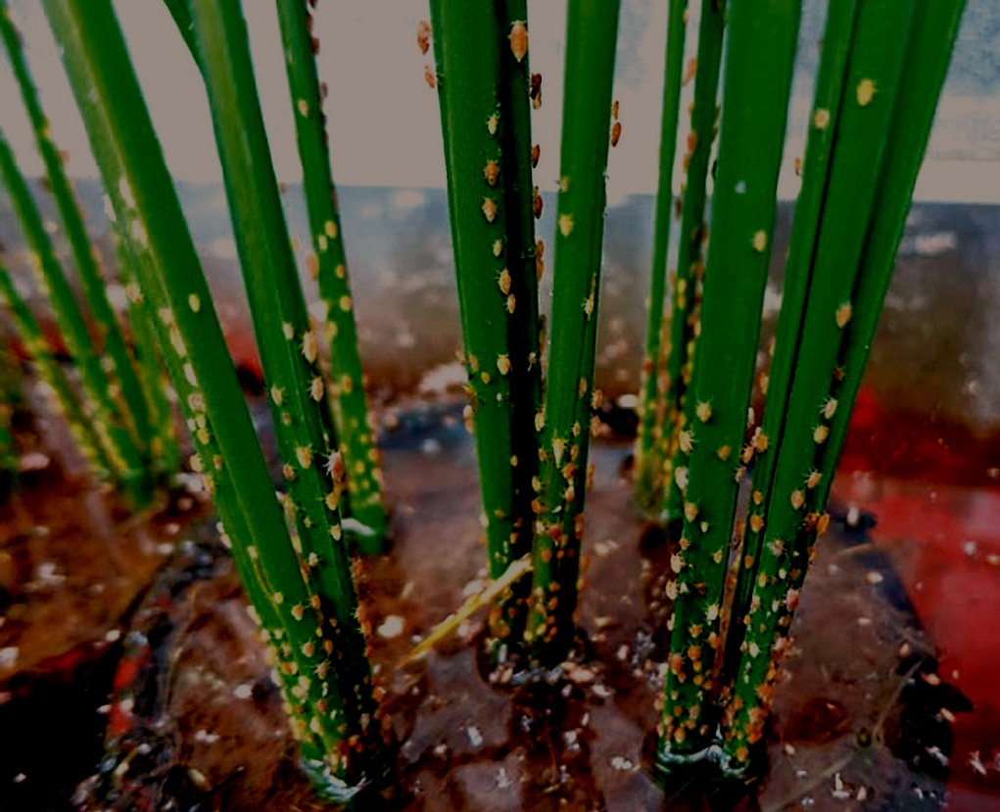

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_35_0609_224156.jpg
Done


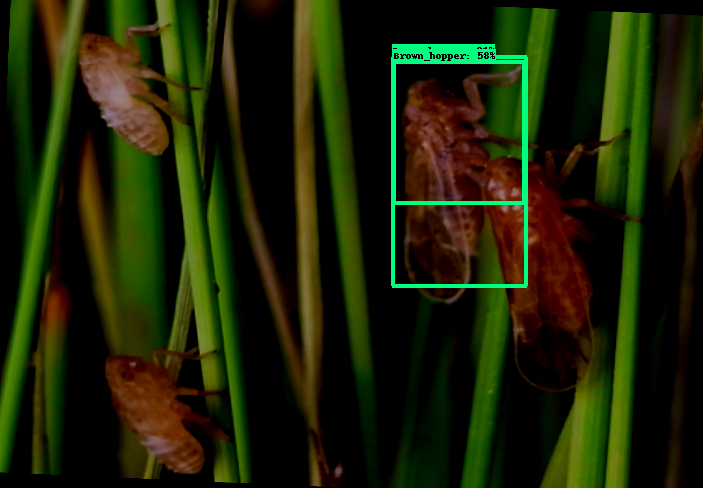

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_12_0609_224157.jpg
Done


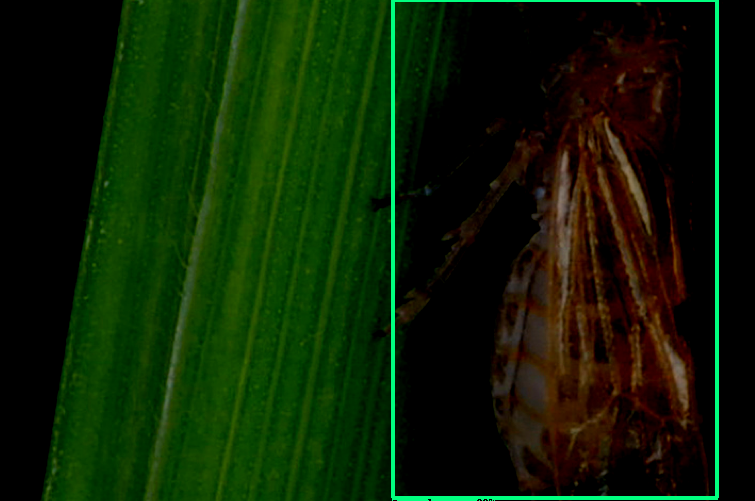

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_39_0609_224157.jpg
Done


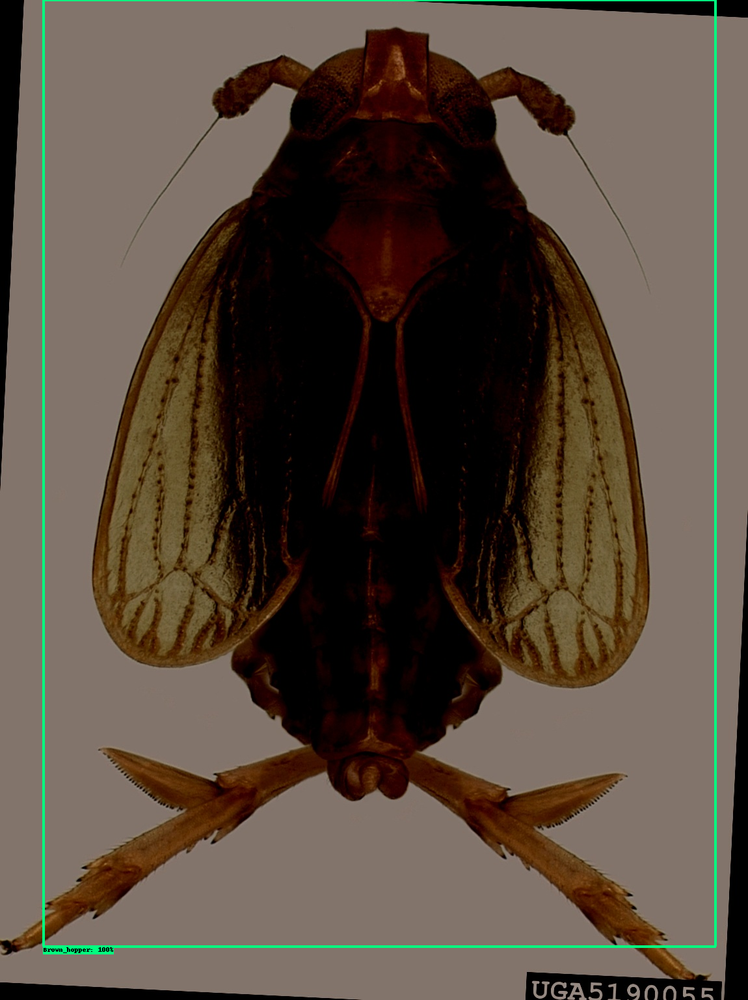

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_20_0609_224157.jpg
Done


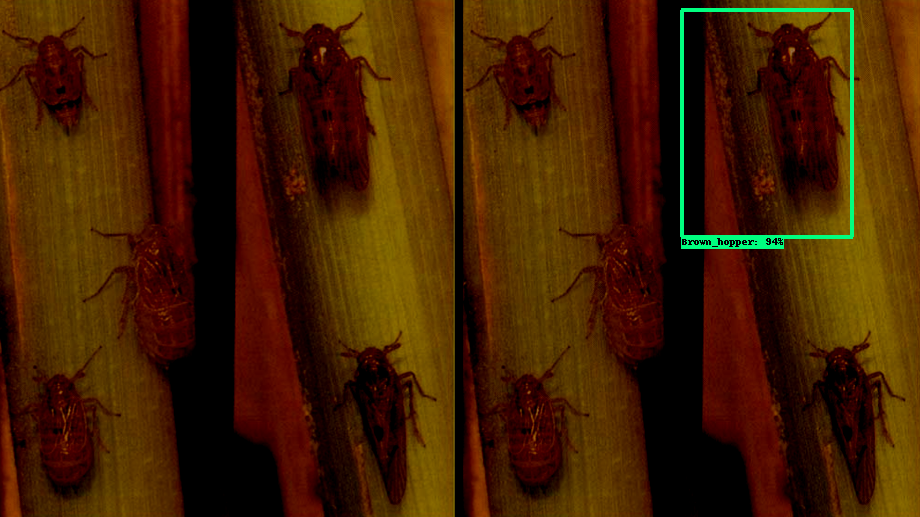

Image saved to /content/drive/MyDrive/A-TASK-1/Detected_images/augmented_Image_41_0609_224158.jpg


In [40]:
###giving image path for model and destination folder to detected images
IMAGE_PATHS = '/content/drive/MyDrive/A-TASK-1/normalised_images'
destination_folder = "/content/drive/MyDrive/A-TASK-1/Detected_images"  

print('Running inference for {}... '.format(IMAGE_PATHS), end='')
###################################################################
for filename in os.listdir(IMAGE_PATHS):
   # Get the current date and time
   timestamp = datetime.now().strftime("%m%d_%H%M%S")
   if filename.endswith(('.jpg', '.jpeg', '.png', '.gif')):
        # Open the image
        image_path = os.path.join(IMAGE_PATHS, filename)
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image_expanded = np.expand_dims(image_rgb, axis=0)
        new_filename = f"{os.path.splitext(filename)[0]}_{timestamp}.jpg"
        # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
        input_tensor = tf.convert_to_tensor(image)
        # The model expects a batch of images, so add an axis with `tf.newaxis`.
        input_tensor = input_tensor[tf.newaxis, ...]

        # input_tensor = np.expand_dims(image_np, 0)
        detections = detect_fn(input_tensor)

        # All outputs are batches tensors.
        # Convert to numpy arrays, and take index [0] to remove the batch dimension.
        # We're only interested in the first num_detections.
        num_detections = int(detections.pop('num_detections'))
        detections = {key: value[0, :num_detections].numpy()
                      for key, value in detections.items()}
        detections['num_detections'] = num_detections

        # detection_classes should be ints.
        detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

        image_with_detections = image.copy()

        # SET MIN_SCORE_THRESH BASED ON YOU MINIMUM THRESHOLD FOR DETECTIONS
        viz_utils.visualize_boxes_and_labels_on_image_array(
              image_with_detections,
              detections['detection_boxes'],
              detections['detection_classes'],
              detections['detection_scores'],
              category_index,
              use_normalized_coordinates=True,
              max_boxes_to_draw=200,
              min_score_thresh=0.5,
              agnostic_mode=False)

        print('Done')

        # DISPLAYS OUTPUT IMAGE
        cv2_imshow(image_with_detections)
        image = Image.fromarray(image_with_detections)
        destination_path = os.path.join(destination_folder, new_filename)
        image.save(destination_path)
        print(f"Image saved to {destination_path}")